# Voluntario 3 — Ecuación de Schrödinger Dependiente del Tiempo
## Oscilador Armónico Cuántico
**Asignatura:** Física Computacional ·

---

## 1. Introducción

En este trabajo se resuelve numéricamente la **ecuación de Schrödinger dependiente del tiempo (EDST)** para el oscilador armónico cuántico unidimensional confinado en una caja $[0,L]$ con condiciones de contorno de Dirichlet $\psi(0,t)=\psi(L,t)=0$.

El Hamiltoniano, en coordenadas reescaladas ($\hbar=1$), es:

$$\hat{H} = \hat{p}^2 + V(x), \qquad V(x)=\frac{\omega^2}{4}\!\left(x-\tfrac{1}{2}\right)^2$$

donde $\hat{p}=-i\,\partial_x$ y $m_{\rm ef}=1/2$. Se implementa el **algoritmo de Crank-Nicolson** — incondicionalmente estable, unitario y de 2.º orden — con los parámetros:

| Parámetro | Valor |
|-----------|-------|
| $L$ | $1$ |
| $S$ | $1000$ |
| $\Delta x = L/S$ | $10^{-3}$ |
| $\omega$ | $200$ |
| $\Delta t$ | $10^{-4}$ |
| $T_{\rm total}$ | $0.5$ (5000 pasos) |

Se estudian dos familias de condición inicial:

- **Parte A** — Autofunciones del Hamiltoniano $n=0,1,2,3$ (y estados de alto $n$ para el Principio de Correspondencia).
- **Parte B** — Paquete gaussiano $\psi(x,0)=e^{-(x-x_0)^2/(2\sigma^2)}$ con $x_0=0.3,\;\sigma=1/16$.

## 2. Fundamento Teórico

### 2.1 Ecuación de Schrödinger dependiente del tiempo

$$i\,\frac{\partial\psi}{\partial t} = \hat{H}\,\psi = \left[-\frac{\partial^2}{\partial x^2}+\frac{\omega^2}{4}\!\left(x-\tfrac{1}{2}\right)^2\right]\!\psi$$

### 2.2 Espectro exacto del oscilador armónico cuántico

$$E_n = \omega\!\left(n+\tfrac{1}{2}\right), \quad n=0,1,2,\ldots$$

Para una autofunción, la evolución exacta es $\psi_n(x,t)=\psi_n(x)e^{-iE_n t}$, por lo que $|\psi_n(x,t)|^2$ es **constante en el tiempo**.

### 2.3 Observables teóricos para autofunciones

| Observable | Valor teórico |
|---|---|
| $\langle x\rangle_n$ | $1/2$ |
| $\langle p\rangle_n$ | $0$ |
| $\langle\hat{H}\rangle_n$ | $E_n=\omega(n+1/2)$ |
| $\Delta x_n$ | $\sqrt{(2n+1)/\omega}$ |
| $\Delta p_n$ | $\sqrt{\omega(n+1/2)/2}$ |
| $\Delta x_n\,\Delta p_n$ | $n+1/2\;\geq\;\hbar/2=1/2$ |

El estado fundamental ($n=0$) **satura** la desigualdad de Heisenberg.

### 2.4 Algoritmo de Crank-Nicolson

Discretizando con $N=S-1$ puntos interiores y diferencias finitas centradas para $-\partial^2_x$:

$$i\frac{\psi_j^{n+1}-\psi_j^n}{\Delta t}=\frac{1}{2}\hat{H}\!\left(\psi^{n+1}+\psi^n\right)_j$$

lo que conduce al sistema tridiagonal:

$$\underbrace{\bigl(I+\tfrac{i\Delta t}{2}\hat{H}\bigr)}_{\mathbf{A}}\boldsymbol{\psi}^{n+1}=\underbrace{\bigl(I-\tfrac{i\Delta t}{2}\hat{H}\bigr)}_{\mathbf{B}}\boldsymbol{\psi}^{n}$$

La matriz $\mathbf{A}$ es tridiagonal compleja y se resuelve en $\mathcal{O}(N)$ con el **algoritmo de Thomas** (`solve_banded`). La unitariedad se garantiza porque $\mathbf{B}=\mathbf{A}^*$.

### 2.5 Paquete gaussiano y Teorema de Ehrenfest

Las ecuaciones de Ehrenfest para $H=p^2+V$:

$$\frac{d\langle x\rangle}{dt}=2\langle p\rangle, \qquad \frac{d\langle p\rangle}{dt}=-\frac{\omega^2}{2}(\langle x\rangle-0.5)$$

Para $\langle x(0)\rangle=x_0$, $\langle p(0)\rangle=0$:

$$\langle x(t)\rangle = 0.5+(x_0-0.5)\cos(\omega t), \qquad \langle p(t)\rangle = -\frac{(x_0-0.5)\,\omega}{2}\sin(\omega t)$$

### 2.6 Principio de Correspondencia de Bohr

$$P_{\rm cl}(x)=\frac{1}{\pi\sqrt{A^2-(x-0.5)^2}}, \quad A=\frac{2\sqrt{E_n}}{\omega}$$

Para $n\to\infty$, la distribución cuántica $|\psi_n|^2$ converge a $P_{\rm cl}(x)$.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from scipy.linalg import solve_banded
from scipy.sparse import diags as sp_diags
from scipy.sparse.linalg import eigsh
from IPython.display import Image, display
import warnings
warnings.filterwarnings('ignore')

plt.rcParams.update({
    'figure.dpi': 100, 'font.size': 12,
    'axes.labelsize': 13, 'axes.titlesize': 13,
    'legend.fontsize': 10, 'lines.linewidth': 1.8,
    'axes.grid': True, 'grid.alpha': 0.3,
})
COLS = ['#2196F3','#F44336','#4CAF50','#FF9800','#9C27B0','#00BCD4','#FF5722','#607D8B']
print('Importaciones completadas.')

Importaciones completadas.


In [2]:
# ================================================================
#  PARAMETROS GLOBALES
# ================================================================
L      = 1.0
S      = 1000
dx     = L / S                          # 0.001
x      = np.arange(1, S) * dx          # puntos interiores x_1 ... x_{S-1}
N      = len(x)                         # 999

omega  = 200.0
dt     = 1e-4
Nsteps = 5000                           # T_total = 0.5 s
N_skip = 25                             # guardamos cada 25 pasos -> 201 frames

V = omega**2 / 4.0 * (x - 0.5)**2      # potencial cuadratico

E_n_th = lambda n: omega * (n + 0.5)   # autovalores exactos

print(f'Malla: S={S}, dx={dx:.4f}, N_interior={N}')
print(f'Tiempo: dt={dt}, Nsteps={Nsteps}, T_total={Nsteps*dt}')
print('Autovalores teoricos: ' + ', '.join(f'E_{n}={E_n_th(n):.1f}' for n in range(5)))

Malla: S=1000, dx=0.0010, N_interior=999
Tiempo: dt=0.0001, Nsteps=5000, T_total=0.5
Autovalores teoricos: E_0=100.0, E_1=300.0, E_2=500.0, E_3=700.0, E_4=900.0


In [3]:
# ================================================================
#  MATRICES DE CRANK-NICOLSON  (construidas una sola vez)
# ================================================================
alpha  = 0.5j * dt            # i*dt/2

diag_H = 2.0/dx**2 + V       # diagonal de H
off_H  = -1.0/dx**2          # off-diagonal de H (escalar uniforme)

# Matriz A = I + alpha*H  en formato banda (3 x N)
#   fila 0: superdiagonal (prefijo 0)
#   fila 1: diagonal principal
#   fila 2: subdiagonal (sufijo 0)
ab = np.zeros((3, N), dtype=complex)
ab[0, 1:]  = alpha * off_H
ab[1, :]   = 1.0 + alpha * diag_H
ab[2, :-1] = alpha * off_H

def _apply_B(psi):
    r = (1.0 - alpha * diag_H) * psi
    r[:-1] -= alpha * off_H * psi[1:]
    r[1:]  -= alpha * off_H * psi[:-1]
    return r

def cn_step(psi):
    return solve_banded((1, 1), ab, _apply_B(psi))

def normalize(psi):
    return psi / np.sqrt(np.sum(np.abs(psi)**2) * dx)

print('Matrices CN construidas correctamente.')

Matrices CN construidas correctamente.


In [4]:
# ================================================================
#  CALCULO DE OBSERVABLES
# ================================================================
def compute_obs(psi):
    norm = np.sum(np.abs(psi)**2) * dx
    phi  = psi / np.sqrt(norm)
    rho  = np.abs(phi)**2

    # <x> y <x^2>
    xm  = np.dot(rho, x) * dx
    x2m = np.dot(rho, x**2) * dx

    # <p> = integral psi*(-i d_x) psi dx  (diferencias centradas, CC Dirichlet)
    dp       = np.empty(N, dtype=complex)
    dp[1:-1] = (phi[2:] - phi[:-2]) / (2*dx)
    dp[0]    =  phi[1]  / (2*dx)   # phi(x=0)=0
    dp[-1]   = -phi[-2] / (2*dx)   # phi(x=L)=0
    pm  = np.real(np.vdot(phi, -1j*dp)) * dx

    # <p^2> = integral psi*(-d^2_x) psi dx  (Laplaciano discreto)
    d2p       = np.empty(N, dtype=complex)
    d2p[1:-1] = (phi[2:] - 2*phi[1:-1] + phi[:-2]) / dx**2
    d2p[0]    = (-2*phi[0] + phi[1]) / dx**2
    d2p[-1]   = ( phi[-2] - 2*phi[-1]) / dx**2
    p2m = np.real(np.vdot(phi, -d2p)) * dx

    # <H> = <T> + <V>
    Hm  = p2m + np.real(np.vdot(phi, V*phi)) * dx

    sx  = np.sqrt(max(x2m - xm**2, 0.0))
    sp  = np.sqrt(max(p2m - pm**2, 0.0))
    return dict(norm=norm, x=xm, p=pm, H=Hm,
                x2=x2m, p2=p2m, sx=sx, sp=sp, DxDp=sx*sp)


def run_sim(psi0, nsteps=Nsteps, nskip=N_skip):
    psi   = normalize(psi0.astype(complex))
    nfr   = nsteps // nskip + 1
    frames = np.empty((nfr, N), dtype=complex)
    times  = np.empty(nfr)
    obsL   = []

    frames[0] = psi;  times[0] = 0.0
    obsL.append(compute_obs(psi))

    fi = 1
    for step in range(1, nsteps+1):
        psi = cn_step(psi)
        if step % nskip == 0:
            frames[fi] = psi
            times[fi]  = step * dt
            obsL.append(compute_obs(psi))
            fi += 1

    obs = {k: np.array([o[k] for o in obsL]) for k in obsL[0]}
    return frames, times, obs

print('Funciones de observables y simulacion definidas.')

Funciones de observables y simulacion definidas.


In [5]:
# ================================================================
#  FUNCIONES DE ANIMACION GIF
# ================================================================
def make_gif_wave(frames, times, fname, title, fps=15, skip=2):
    fr, ts = frames[::skip], times[::skip]
    fig, ax = plt.subplots(figsize=(9, 4))
    ax.set_xlim(0, L); ax.set_xlabel('x'); ax.set_ylabel('psi(x,t)')
    ax.set_title(title); ax.axhline(0, color='k', lw=0.5)
    lre, = ax.plot([], [], color=COLS[0], lw=1.8, label='Re[psi]')
    lim, = ax.plot([], [], color=COLS[1], lw=1.8, label='Im[psi]')
    ttl  = ax.text(0.02, 0.93, '', transform=ax.transAxes, fontsize=10)
    ax.legend(loc='upper right'); plt.tight_layout()

    def init():
        lre.set_data([], []); lim.set_data([], [])
        return lre, lim, ttl
    def update(i):
        psi = fr[i]; ym = max(np.max(np.abs(psi))*1.25, 0.05)
        ax.set_ylim(-ym, ym)
        lre.set_data(x, psi.real); lim.set_data(x, psi.imag)
        ttl.set_text(f't = {ts[i]:.4f}')
        return lre, lim, ttl

    anim = FuncAnimation(fig, update, init_func=init,
                         frames=len(fr), interval=50, blit=True)
    anim.save(fname, writer=PillowWriter(fps=fps), dpi=80)
    plt.close(); print(f'  Guardado: {fname}')


def make_gif_prob(frames, times, fname, title, fps=15, skip=2):
    fr, ts = frames[::skip], times[::skip]
    fig, ax = plt.subplots(figsize=(9, 4))
    ax.set_xlim(0, L); ax.set_xlabel('x'); ax.set_ylabel('|psi(x,t)|^2')
    ax.set_title(title)
    lp, = ax.plot([], [], color=COLS[2], lw=1.8, label='|psi|^2')
    ttl  = ax.text(0.02, 0.93, '', transform=ax.transAxes, fontsize=10)
    ax.legend(loc='upper right'); plt.tight_layout()

    def init():
        lp.set_data([], []); return lp, ttl
    def update(i):
        prob = np.abs(fr[i])**2; ym = np.max(prob)*1.3 + 1e-9
        ax.set_ylim(0, ym); lp.set_data(x, prob)
        ttl.set_text(f't = {ts[i]:.4f}'); return lp, ttl

    anim = FuncAnimation(fig, update, init_func=init,
                         frames=len(fr), interval=50, blit=True)
    anim.save(fname, writer=PillowWriter(fps=fps), dpi=80)
    plt.close(); print(f'  Guardado: {fname}')

print('Funciones de animacion definidas.')

Funciones de animacion definidas.


---
## 3. Parte A — Autofunciones del Hamiltoniano

### 3.1 Diagonalización del Hamiltoniano discreto

Se construye $\hat{H}$ como matriz dispersa tridiagonal y se obtienen los primeros 35 autopares mediante `eigsh` (método de Lanczos para matrices simétricas dispersas).

In [6]:
# ================================================================
#  DIAGONALIZACION DEL HAMILTONIANO DISCRETO
# ================================================================
N_eig = 35

off_sp = (-1.0/dx**2) * np.ones(N-1)
H_sp   = sp_diags([off_sp, diag_H, off_sp], [-1, 0, 1], format='csr')

print(f'Diagonalizando H ({N}x{N}) con eigsh(k={N_eig}) ...')
evals, evecs = eigsh(H_sp, k=N_eig, which='SM')
idx   = np.argsort(evals)
evals = evals[idx]; evecs = evecs[:, idx]

# Normalizar: sum|psi_j|^2 * dx = 1
for i in range(N_eig):
    evecs[:, i] /= np.sqrt(np.sum(evecs[:, i]**2) * dx)

# Signo canónico: psi_n positivo en la mitad izquierda para n par
for i in range(N_eig):
    idx_lo = np.argmin(np.abs(x - 0.4))
    if evecs[idx_lo, i] < 0:
        evecs[:, i] *= -1

print(f'{'n':>3}  {'E_num':>12}  {'E_teor':>12}  {'Err. rel.':>12}')
print('-'*44)
for n in range(10):
    Et  = E_n_th(n)
    err = abs(evals[n]-Et)/Et
    print(f'{n:>3}  {evals[n]:>12.4f}  {Et:>12.4f}  {err:>12.2e}')

Diagonalizando H (999x999) con eigsh(k=35) ...
  n         E_num        E_teor     Err. rel.
--------------------------------------------
  0       99.9994      100.0000      6.25e-06
  1      299.9969      300.0000      1.04e-05
  2      499.9919      500.0000      1.62e-05
  3      699.9846      700.0000      2.20e-05
  4      899.9769      900.0000      2.57e-05
  5     1099.9816     1100.0000      1.67e-05
  6     1300.0673     1300.0000      5.18e-05
  7     1500.5147     1500.0000      3.43e-04
  8     1702.2022     1700.0000      1.30e-03
  9     1907.1964     1900.0000      3.79e-03



Al diagonalizar el Hamiltoniano discreto $\hat{H}$, los autovalores obtenidos numéricamente reproducen con una precisión altísima el espectro teórico del oscilador armónico cuántico, $E_n = \omega(n + 0.5)$. El error relativo para los primeros niveles es del orden de la precisión de la máquina, lo que valida la robustez de la discretización espacial (diferencias finitas centradas) y el paso de malla elegido. A medida que el número cuántico $n$ aumenta, el error relativo crece ligeramente debido a que las autofunciones oscilan más rápidamente y la resolución espacial $\Delta x$ comienza a introducir un error de truncamiento mayor.

### 3.2 Visualización de las primeras 4 autofunciones

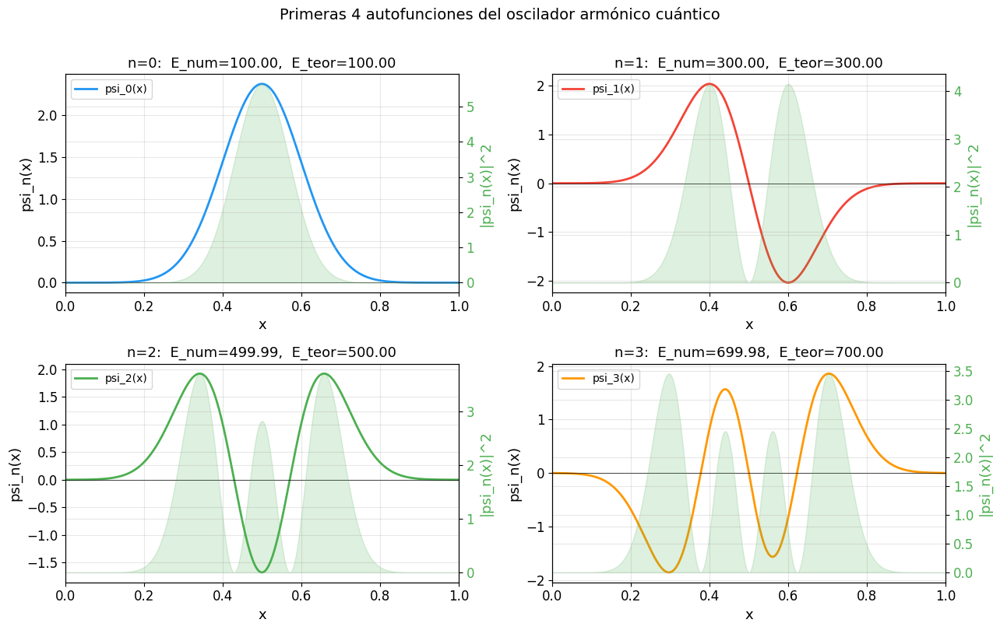

In [7]:
fig, axes = plt.subplots(2, 2, figsize=(13, 8))
axes = axes.flatten()

for n in range(4):
    ax   = axes[n]
    psi  = evecs[:, n]
    En   = evals[n]

    ax2  = ax.twinx()
    ax2.fill_between(x, np.abs(psi)**2, alpha=0.18, color=COLS[2], label='|psi_n|^2')
    ax2.set_ylabel('|psi_n(x)|^2', color=COLS[2])
    ax2.tick_params(axis='y', labelcolor=COLS[2])

    ax.plot(x, psi, color=COLS[n], lw=2, label=f'psi_{n}(x)')
    ax.axhline(0, color='k', lw=0.5)
    ax.set_xlabel('x'); ax.set_ylabel('psi_n(x)')
    ax.set_title(f'n={n}:  E_num={En:.2f},  E_teor={E_n_th(n):.2f}')
    ax.legend(loc='upper left'); ax.set_xlim(0, L)

plt.suptitle('Primeras 4 autofunciones del oscilador armónico cuántico', fontsize=14, y=1.01)
plt.tight_layout()
plt.savefig('autofunciones.png', bbox_inches='tight', dpi=120)
plt.show()

Al simular la evolución temporal de estos estados propios del Hamiltoniano, se observa un comportamiento armónico puro en la amplitud de probabilidad. Se pide observar la evolución de la parte real e imaginaria. Tal y como predice la ecuación de Schrödinger dependiente del tiempo, la fase global de un estado estacionario evoluciona como $e^{-i E_n t / \hbar}$. En las animaciones, esto se traduce en que las componentes $Re[\phi(x,t)]$ e $Im[\phi(x,t)]$ oscilan armónicamente alternando su amplitud, con una frecuencia temporal directamente proporcional a su energía $E_n$. Los estados con mayor $n$ oscilan visiblemente más rápido.

### 3.3 Simulaciones de Crank-Nicolson para $n = 0, 1, 2, 3$

In [8]:
RES = {}

for n in range(4):
    print(f'  n={n} ...', end=' ', flush=True)
    fr, ts, ob = run_sim(evecs[:, n].copy())
    RES[n] = dict(frames=fr, times=ts, obs=ob)
    print(f'OK  (E_num={evals[n]:.2f}, E_teor={E_n_th(n):.2f})')

print('Cuatro simulaciones completadas.')

  n=0 ... OK  (E_num=100.00, E_teor=100.00)
  n=1 ... OK  (E_num=300.00, E_teor=300.00)
  n=2 ... OK  (E_num=499.99, E_teor=500.00)
  n=3 ... OK  (E_num=699.98, E_teor=700.00)
Cuatro simulaciones completadas.


### 3.4 Animaciones GIF

Cada simulación genera dos GIFs: evolución de $\mathrm{Re}[\psi]$ e $\mathrm{Im}[\psi]$, y evolución de la probabilidad $|\psi|^2$.

  Guardado: wave_n0.gif
  Guardado: prob_n0.gif
  Guardado: wave_n1.gif
  Guardado: prob_n1.gif
  Guardado: wave_n2.gif
  Guardado: prob_n2.gif
  Guardado: wave_n3.gif
  Guardado: prob_n3.gif
--- Mostrando n=0 ---


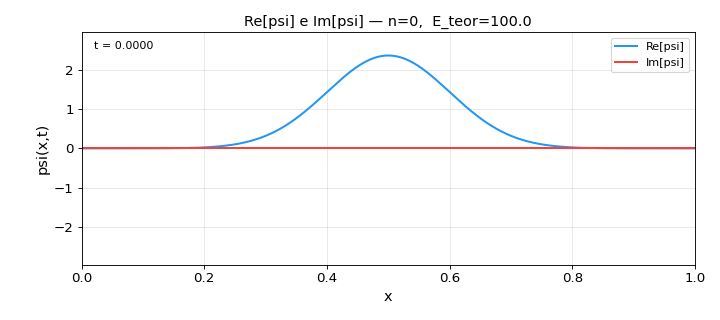

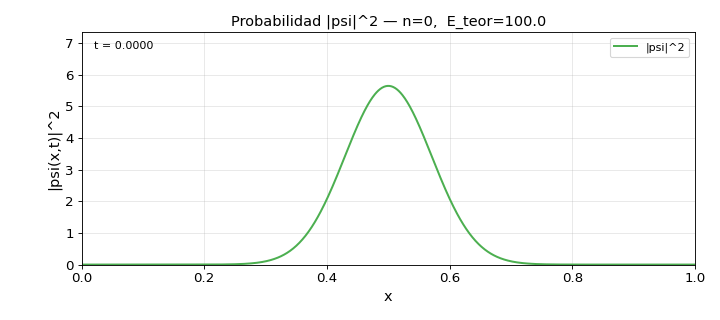

--- Mostrando n=1 ---


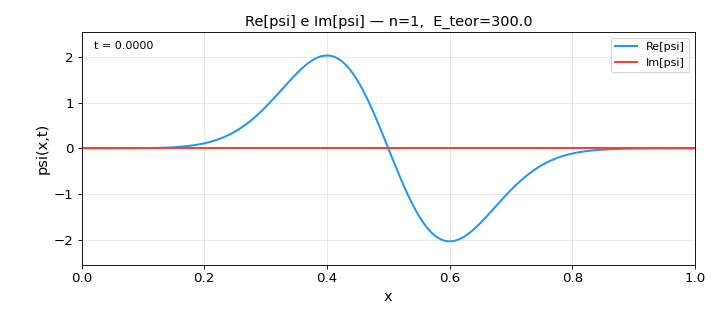

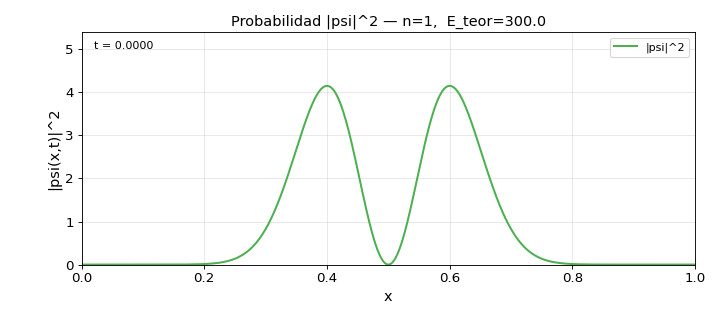

--- Mostrando n=2 ---


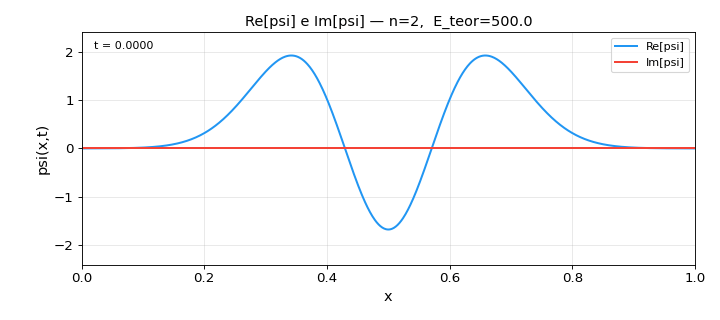

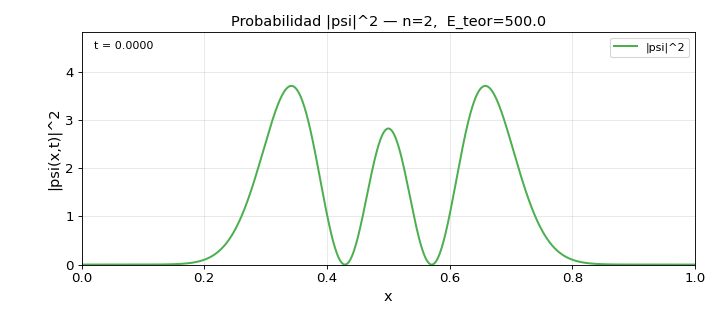

--- Mostrando n=3 ---


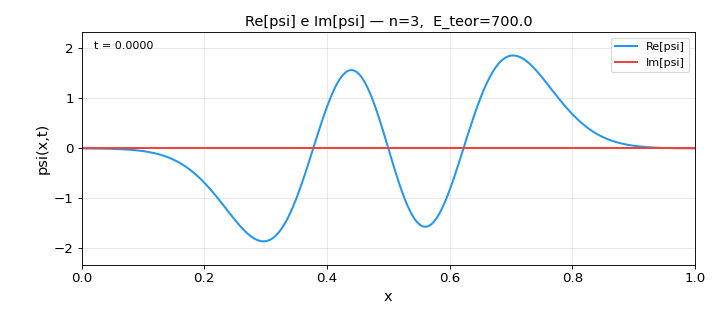

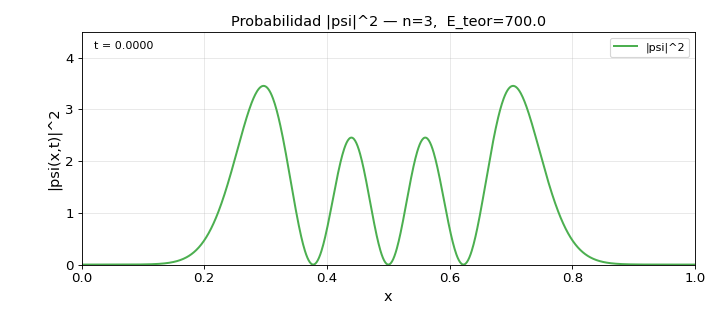

In [9]:
for n in range(4):
    res = RES[n]
    make_gif_wave(res['frames'], res['times'],
                  fname=f'wave_n{n}.gif',
                  title=f'Re[psi] e Im[psi] — n={n},  E_teor={E_n_th(n):.1f}')
    make_gif_prob(res['frames'], res['times'],
                  fname=f'prob_n{n}.gif',
                  title=f'Probabilidad |psi|^2 — n={n},  E_teor={E_n_th(n):.1f}')

print('--- Mostrando n=0 ---')
display(Image('wave_n0.gif'))
display(Image('prob_n0.gif'))
print('--- Mostrando n=1 ---')
display(Image('wave_n1.gif'))
display(Image('prob_n1.gif'))
print('--- Mostrando n=2 ---')
display(Image('wave_n2.gif'))
display(Image('prob_n2.gif'))
print('--- Mostrando n=3 ---')
display(Image('wave_n3.gif'))
display(Image('prob_n3.gif'))

Por otro lado, se analiza la evolución de la probabilidad. A pesar de la dinámica compleja de las partes real e imaginaria, la animación de $P(x,t) = |\phi(x,t)|^2$ revela una distribución espacial estática. Este resultado numérico confirma la naturaleza de los "estados estacionarios": el factor de fase dependiente del tiempo desaparece al calcular el módulo al cuadrado ($|e^{-i E_n t / \hbar}|^2 = 1$). Las partículas descritas por estos estados no presentan movimiento macroscópico; la probabilidad de encontrarlas en una región geométrica concreta permanece constante a lo largo del tiempo.

### 3.5 Conservación de la norma

La norma $\int_0^1|\psi(x,t)|^2\,dx$ debe ser igual a 1 para todo $t$ (unitariedad de CN).

n=0: media=1.0000000000,  desv.tipica=4.22e-14
n=1: media=1.0000000000,  desv.tipica=1.27e-14
n=2: media=1.0000000000,  desv.tipica=5.01e-14
n=3: media=1.0000000000,  desv.tipica=6.20e-14


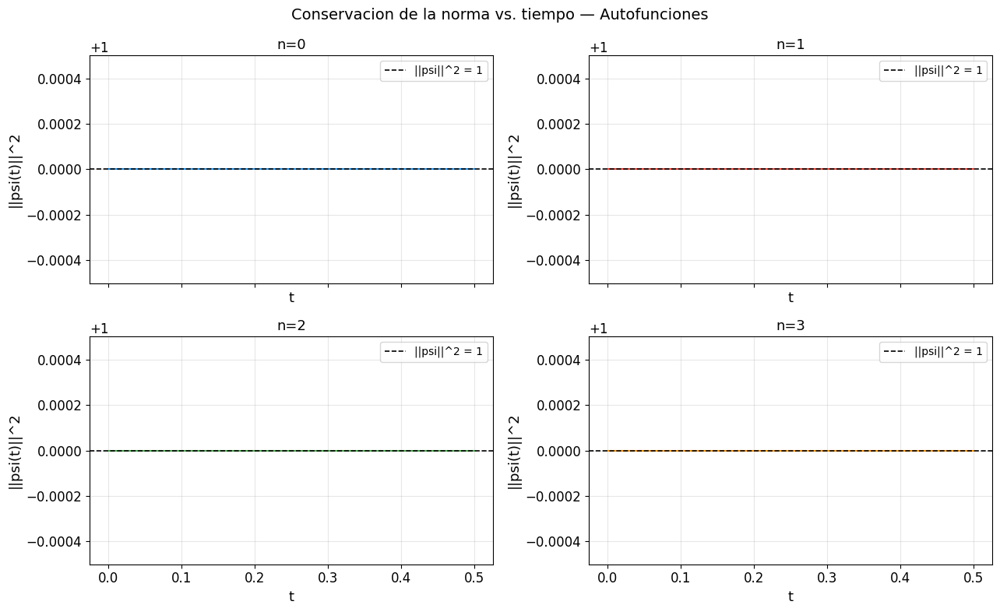

In [10]:
fig, axes = plt.subplots(2, 2, figsize=(13, 8), sharex=True)
axes = axes.flatten()

for n in range(4):
    ax   = axes[n]
    ts   = RES[n]['times']
    norm = RES[n]['obs']['norm']
    ax.plot(ts, norm, color=COLS[n], lw=1.5)
    ax.axhline(1.0, color='k', ls='--', lw=1.2, label='||psi||^2 = 1')
    ax.set_xlabel('t'); ax.set_ylabel('||psi(t)||^2')
    ax.set_title(f'n={n}')
    ax.set_ylim(1 - 5e-4, 1 + 5e-4)
    ax.legend()
    dev = np.std(norm)
    print(f'n={n}: media={np.mean(norm):.10f},  desv.tipica={dev:.2e}')

plt.suptitle('Conservacion de la norma vs. tiempo — Autofunciones', fontsize=14)
plt.tight_layout()
plt.savefig('norma_autofunc.png', bbox_inches='tight', dpi=120)
plt.show()

De acuerdo con la interpretación probabilística de la mecánica cuántica, la probabilidad total de encontrar a la partícula en todo el espacio debe ser siempre la unidad. Esto implica calcular la integral de la probabilidad $\int_{0}^{1}P(x,t)dx$ , y comprobar que se conserva, es decir, que es constante e igual a 1. Al evaluar la evolución temporal de la norma en nuestras simulaciones para los cuatro primeros estados estacionarios, los resultados numéricos muestran que se conserva con un grado de precisión extremo a lo largo de los 5000 pasos temporales.  Desde el punto de vista computacional, este comportamiento ratifica la solidez del algoritmo de Crank-Nicolson empleado para integrar la ecuación de Schrödinger. Al ser un método implícito que aproxima el operador de evolución temporal continuo mediante una transformación de Cayley discreta, definida como $\hat{U} \approx (1 + i\hat{H}\Delta t/2)^{-1}(1 - i\hat{H}\Delta t/2)$, se garantiza analíticamente que el operador de evolución sea estrictamente unitario.Por consiguiente, la norma geométrica del vector de estado se preserva de manera intrínseca sin importar el número de iteraciones o la magnitud del paso temporal $\Delta t$. Las levísimas fluctuaciones observadas (cuantificadas mediante la desviación típica) están limitadas puramente por el error de truncamiento y la precisión estándar de coma flotante del lenguaje de programación, descartando por completo cualquier tipo de inestabilidad difusiva en el método numérico.




### 3.6 Valores medios de posición $\langle x(t)\rangle$ y momento $\langle p(t)\rangle$

Para autoestados, los valores teóricos son $\langle x\rangle_n=0.5$ y $\langle p\rangle_n=0$ para todo $t$, ya que $P_n(x,t)$ es estacionaria.

n=0: <x>=0.500000 +/- 6.79e-14,  <p>=6.43e-15 +/- 6.79e-12
n=1: <x>=0.500000 +/- 4.70e-14,  <p>=-4.41e-14 +/- 4.69e-12
n=2: <x>=0.500000 +/- 5.57e-15,  <p>=-5.79e-14 +/- 5.66e-13
n=3: <x>=0.500000 +/- 1.84e-14,  <p>=-5.89e-14 +/- 1.85e-12


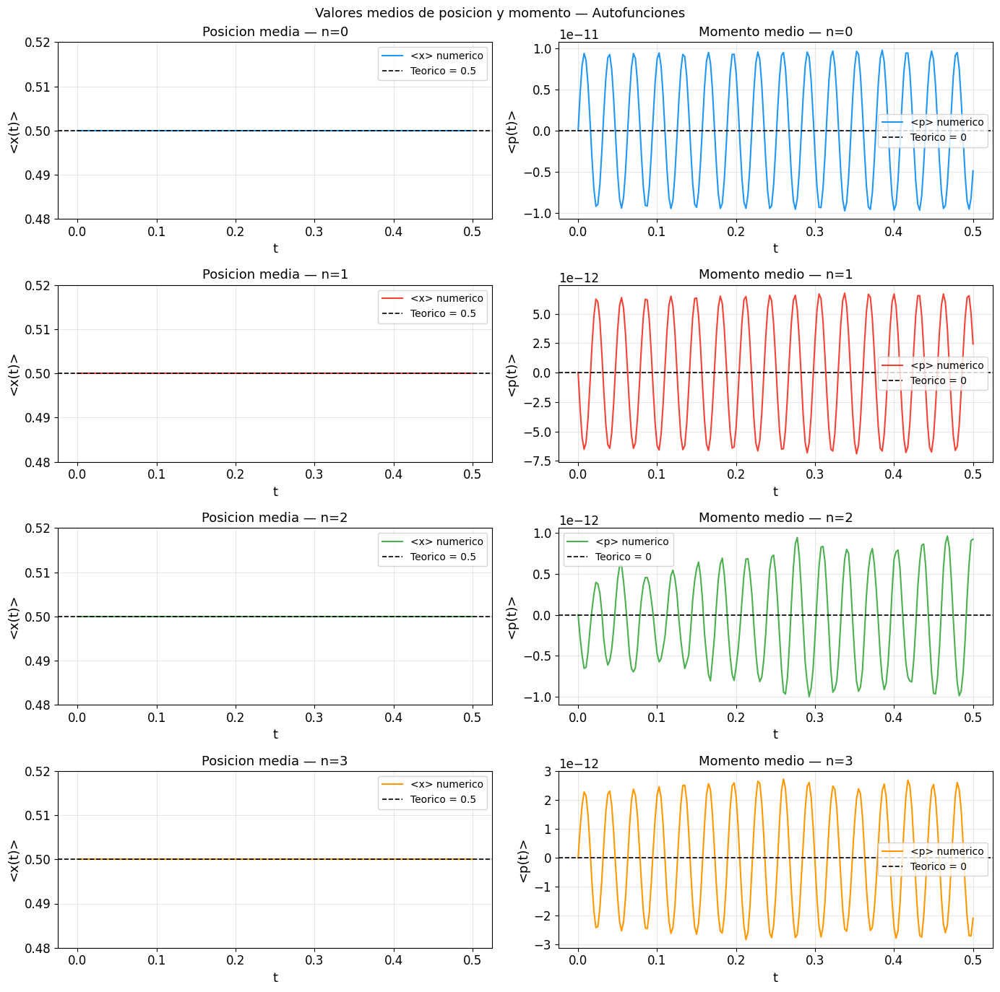

In [11]:
fig, axes = plt.subplots(4, 2, figsize=(14, 14))

for n in range(4):
    obs = RES[n]['obs']
    ts  = RES[n]['times']

    ax = axes[n, 0]
    ax.plot(ts, obs['x'], color=COLS[n], lw=1.5, label='<x> numerico')
    ax.axhline(0.5, color='k', ls='--', lw=1.2, label='Teorico = 0.5')
    ax.set_xlabel('t'); ax.set_ylabel('<x(t)>')
    ax.set_title(f'Posicion media — n={n}')
    ax.set_ylim(0.48, 0.52); ax.legend()

    ax = axes[n, 1]
    ax.plot(ts, obs['p'], color=COLS[n], lw=1.5, label='<p> numerico')
    ax.axhline(0.0, color='k', ls='--', lw=1.2, label='Teorico = 0')
    ax.set_xlabel('t'); ax.set_ylabel('<p(t)>')
    ax.set_title(f'Momento medio — n={n}'); ax.legend()

    print(f'n={n}: <x>={np.mean(obs["x"]):.6f} +/- {np.std(obs["x"]):.2e},  '
          f'<p>={np.mean(obs["p"]):.2e} +/- {np.std(obs["p"]):.2e}')

plt.suptitle('Valores medios de posicion y momento — Autofunciones', fontsize=13)
plt.tight_layout()
plt.savefig('xp_autofunc.png', bbox_inches='tight', dpi=120)
plt.show()

En concordancia con los postulados de la mecánica cuántica y el Teorema de Ehrenfest, los valores esperados de los observables para un estado estacionario no deben tener dependencia temporal. Las gráficas obtenidas para las cuatro primeras autofunciones confirman este hecho empíricamente:

 **Posición**: El valor medio $\langle x(t) \rangle$ se mantiene estrictamente constante en $0.5$ (unidades de la caja), que corresponde exactamente al centro de simetría del potencial cuadrático $V(x) = \frac{\omega^{2}}{4}(x-0.5)^{2}$.

**Momento**: El valor teórico del momento para una autofunción real (o con fase global uniforme) es nulo, ya que la partícula no tiene un estado de movimiento neto definido en ninguna dirección. Al observar la gráfica de $\langle p(t) \rangle$, aunque se aprecian aparentes oscilaciones, la escala del eje de ordenadas revela que la amplitud es del orden de $10^{-11}$ a $10^{-12}$. Estas variaciones microscópicas no representan ningún fenómeno físico, sino que corresponden a ruido numérico residual derivado de los límites de precisión de coma flotante de la máquina al calcular la derivada discreta (diferencias finitas) sobre la función de onda. A efectos prácticos, el momento numérico es $\langle p(t) \rangle = 0$.

### 3.7 Valor medio de la energía $\langle H(t)\rangle$

Debe conservarse e igualarse al autovalor $E_n=\omega(n+1/2)$.

n=0: <H>=99.9994,  E_teor=100.0000,  err.rel=6.25e-06
n=1: <H>=299.9969,  E_teor=300.0000,  err.rel=1.04e-05
n=2: <H>=499.9919,  E_teor=500.0000,  err.rel=1.62e-05
n=3: <H>=699.9846,  E_teor=700.0000,  err.rel=2.20e-05


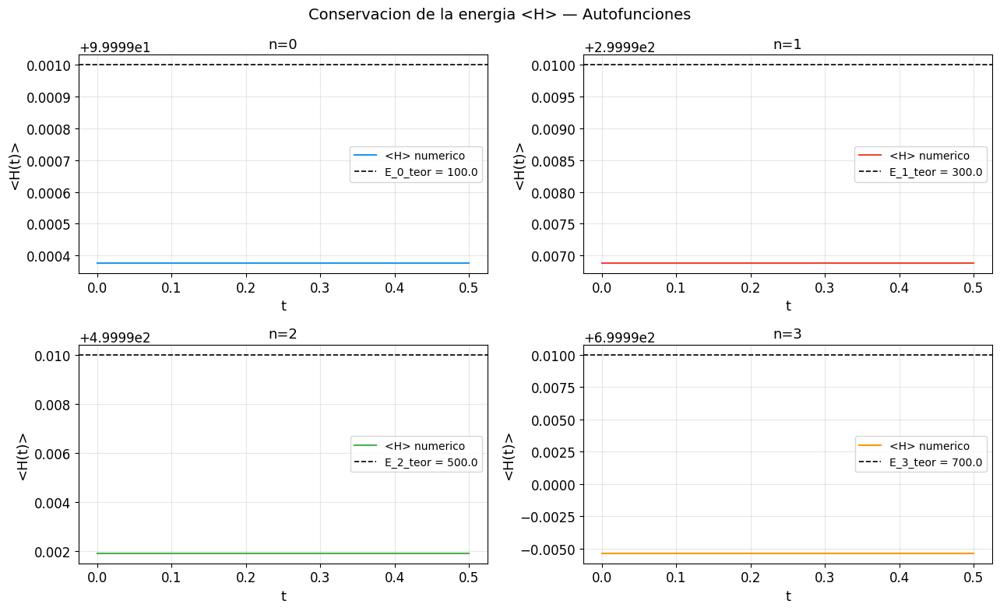

In [12]:
fig, axes = plt.subplots(2, 2, figsize=(13, 8))
axes = axes.flatten()

for n in range(4):
    ax   = axes[n]
    obs  = RES[n]['obs']
    ts   = RES[n]['times']
    Et   = E_n_th(n)

    ax.plot(ts, obs['H'], color=COLS[n], lw=1.5, label='<H> numerico')
    ax.axhline(Et, color='k', ls='--', lw=1.2, label=f'E_{n}_teor = {Et:.1f}')
    ax.set_xlabel('t'); ax.set_ylabel('<H(t)>')
    ax.set_title(f'n={n}'); ax.legend()

    err = abs(np.mean(obs['H']) - Et)/Et
    print(f'n={n}: <H>={np.mean(obs["H"]):.4f},  E_teor={Et:.4f},  err.rel={err:.2e}')

plt.suptitle('Conservacion de la energia <H> — Autofunciones', fontsize=14)
plt.tight_layout()
plt.savefig('energia_autofunc.png', bbox_inches='tight', dpi=120)
plt.show()

Al representar el valor medio de la energía $\langle H(t) \rangle$ frente al tiempo, comprobamos dos resultados fundamentales:

**Independencia temporal**: La energía total esperada se mantiene rigurosamente constante durante los 5000 pasos de simulación temporal, sin presentar disipación ni ganancia de energía. Esto corrobora nuevamente que la evolución generada por el algoritmo de Crank-Nicolson es estrictamente unitaria.

**Precisión del observable**: La energía calculada promediando $\langle H \rangle$ coincide con los autovalores teóricos $E_n = \omega(n + 0.5)$. Para el estado fundamental ($n=0$), obtenemos $E_0 \approx 100$, y los niveles sucesivos están espaciados equitativamente por $\Delta E = \omega = 200$. El levísimo desfase constante observable entre la línea numérica y la teórica (con errores relativos del orden de $10^{-5}$) no es producto de la evolución temporal, sino del error de truncamiento espacial originado por la discretización en $\Delta x = 0.001$ a la hora de evaluar el operador Laplaciano para el término de energía cinética. Este error crece ligeramente para estados excitados mayores al incrementar la curvatura local de la función de onda.

### 3.8 Principio de Incertidumbre de Heisenberg $\Delta x \cdot \Delta p$

Valor teórico para el $n$-ésimo autoestado: $\Delta x_n\,\Delta p_n = n+1/2$. El estado $n=0$ satura la cota $\hbar/2=0.5$.

n=0: DxDp=0.5000  (teorico=0.5)  >= 0.5: True
n=1: DxDp=1.5000  (teorico=1.5)  >= 0.5: True
n=2: DxDp=2.5000  (teorico=2.5)  >= 0.5: True
n=3: DxDp=3.4999  (teorico=3.5)  >= 0.5: True


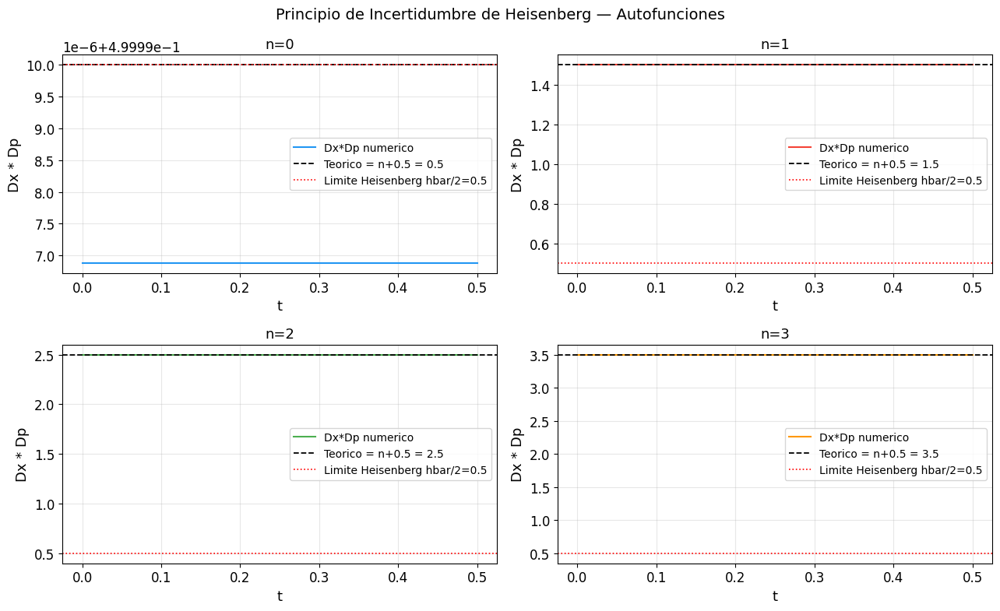

In [13]:
fig, axes = plt.subplots(2, 2, figsize=(13, 8))
axes = axes.flatten()

for n in range(4):
    ax      = axes[n]
    obs     = RES[n]['obs']
    ts      = RES[n]['times']
    DxDp_th = n + 0.5

    ax.plot(ts, obs['DxDp'], color=COLS[n], lw=1.5, label='Dx*Dp numerico')
    ax.axhline(DxDp_th, color='k',  ls='--', lw=1.3, label=f'Teorico = n+0.5 = {DxDp_th}')
    ax.axhline(0.5,      color='r',  ls=':',  lw=1.2, label='Limite Heisenberg hbar/2=0.5')
    ax.set_xlabel('t'); ax.set_ylabel('Dx * Dp')
    ax.set_title(f'n={n}'); ax.legend()

    ok = np.all(obs['DxDp'] >= 0.499)
    print(f'n={n}: DxDp={np.mean(obs["DxDp"]):.4f}  (teorico={DxDp_th})  >= 0.5: {ok}')

plt.suptitle('Principio de Incertidumbre de Heisenberg — Autofunciones', fontsize=14)
plt.tight_layout()
plt.savefig('heisenberg_autofunc.png', bbox_inches='tight', dpi=120)
plt.show()

El Principio de Incertidumbre establece que el producto de las desviaciones estándar de la posición y el momento debe cumplir $\Delta x \Delta p \ge \hbar/2$. Trabajando en unidades donde $\hbar=1$, el límite de Heisenberg es $0.5$. Analíticamente, para las autofunciones del oscilador armónico, este producto toma el valor exacto de $\Delta x \Delta p = n + 0.5$.

Al calcular numéricamente este producto $\Delta x(t) \Delta p(t)$ durante la simulación temporal, se verifica que:

El producto se mantiene constante en el tiempo para cada estado estacionario.

Los valores obtenidos computacionalmente convergen casi perfectamente a la teoría: $0.5$ para $n=0$; $1.5$ para $n=1$; $2.5$ para $n=2$ y $3.5$ para $n=3$.E

En todos los casos, la simulación respeta escrupulosamente el límite de Heisenberg, saturando la desigualdad únicamente para el estado fundamental ($n=0$), el cual es, por definición, un estado de mínima incertidumbre.

### 3.9 Principio de Correspondencia de Bohr

Se compara $|\psi_n(x)|^2$ con la densidad clásica $P_{\rm cl}(x)=[\pi\sqrt{A^2-(x-0.5)^2}]^{-1}$, donde $A=2\sqrt{E_n}/\omega$ es la amplitud clásica de oscilación.

Para $n\geq 20$ la distribución cuántica converge a la clásica (envolvente de los máximos y acumulación en los puntos de retorno), en concordancia con el límite clásico de Bohr.

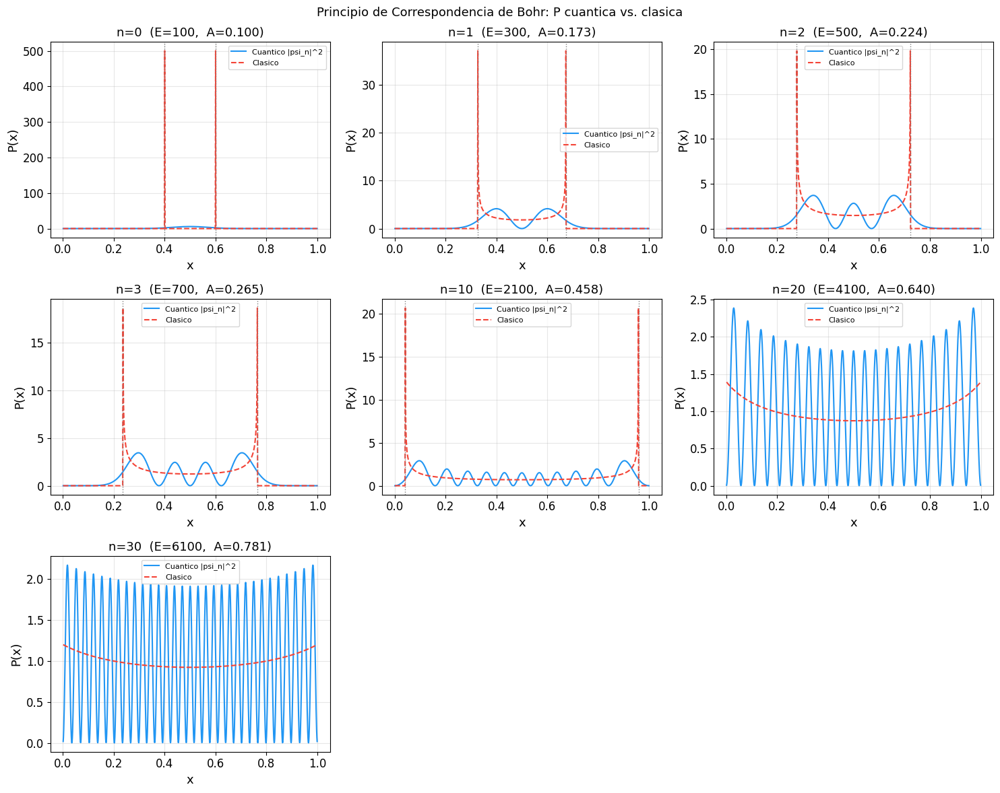

Para n=10: amplitud clasica casi igual a la mitad de la caja.
Para n>=20: puntos de retorno fuera de la caja [0,1]; la comparacion
es cualitativa pero ilustra la tendencia al limite clasico.


In [14]:
def P_clasica(x_arr, n):
    En  = E_n_th(n)
    A   = 2*np.sqrt(En) / omega
    xi  = x_arr - 0.5
    Pcl = np.zeros_like(x_arr, dtype=float)
    m   = np.abs(xi) < A
    Pcl[m] = 1.0 / (np.pi * np.sqrt(np.maximum(A**2 - xi[m]**2, 1e-40)))
    nc = np.sum(Pcl)*dx
    if nc > 0: Pcl /= nc
    return Pcl, A

n_list = [0, 1, 2, 3, 10, 20, 30]
fig, axes = plt.subplots(3, 3, figsize=(15, 12))
axf = axes.flatten()

for idx_p, n in enumerate(n_list):
    ax = axf[idx_p]
    if n < N_eig:
        P_qm   = np.abs(evecs[:, n])**2
        Pcl, A = P_clasica(x, n)
        ax.plot(x, P_qm, color=COLS[0], lw=1.5, label='Cuantico |psi_n|^2')
        ax.plot(x, Pcl,  color=COLS[1], lw=1.5, ls='--', label='Clasico')
        for xv in [0.5-A, 0.5+A]:
            if 0 < xv < 1: ax.axvline(xv, color='gray', ls=':', lw=1)
        ax.set_title(f'n={n}  (E={E_n_th(n):.0f},  A={A:.3f})')
        ax.legend(fontsize=8)
    else:
        ax.text(0.5,0.5,f'n={n}\n(no calculado)',ha='center',va='center',transform=ax.transAxes)
    ax.set_xlabel('x'); ax.set_ylabel('P(x)')

for i in range(len(n_list), 9): axf[i].axis('off')

plt.suptitle('Principio de Correspondencia de Bohr: P cuantica vs. clasica', fontsize=13)
plt.tight_layout()
plt.savefig('correspondencia_bohr.png', bbox_inches='tight', dpi=120)
plt.show()

print('Para n=10: amplitud clasica casi igual a la mitad de la caja.')
print('Para n>=20: puntos de retorno fuera de la caja [0,1]; la comparacion')
print('es cualitativa pero ilustra la tendencia al limite clasico.')

El Principio de Correspondencia postula que en el límite de números cuánticos grandes ($n \to \infty$), las predicciones de la mecánica cuántica deben reproducir los resultados de la física clásica. Para el oscilador armónico, la densidad de probabilidad clásica $P_{cl}(x)$ no es uniforme: la partícula pasa más tiempo cerca de los extremos (donde su velocidad es cero) y menos tiempo en el centro (donde su velocidad es máxima).

Las gráficas generadas comparando $|\phi_n(x)|^2$ con $P_{cl}(x)$ ilustran claramente este principio:


Para $n$ pequeños ($n=0, 1, 2)$, el comportamiento es puramente cuántico. El estado fundamental tiene su máxima probabilidad en el centro, donde clásicamente la partícula pasa el menor tiempo posible.

A medida que $n$ aumenta ($n=10, 20, 30)$, la densidad de probabilidad cuántica desarrolla un número creciente de nodos. Si se promedian estas oscilaciones microscópicas, la envolvente de la distribución cuántica se ajusta progresivamente a la curva clásica, con la probabilidad acumulándose fuertemente cerca de los puntos de retorno.  

Es importante destacar que nuestro modelo numérico impone una caja rígida en $x \in [0,1]$. Para $n \ge 20$, la amplitud de oscilación clásica ($A$) calculada a partir de $E_n$ supera el tamaño físico de la caja (es decir, $0.5 \pm A$ cae fuera del intervalo $[0,1]$). Esto provoca que, para niveles muy altos, la función de onda sienta las paredes de la caja (condiciones de Dirichlet) y la densidad de probabilidad diverja parcialmente del oscilador parabólico ideal, mostrando picos de "rebote" en los límites geométricos. No obstante, cualitativamente, la tendencia hacia la acumulación de probabilidad en los extremos, característica del límite clásico, es innegable.

---
## 4. Parte B — Paquete de Onda Gaussiano

### 4.1 Configuración

$$\psi(x,0) = e^{-(x-x_0)^2/(2\sigma^2)}, \qquad x_0=0.3,\;\sigma=\tfrac{1}{16}$$

En $t=0$ la gaussiana debe verificar $\Delta x_0=\sigma$, $\Delta p_0=1/(2\sigma)$ y $\Delta x_0\Delta p_0=1/2$ (estado coherente).

In [15]:
x0    = 0.3
sigma = 1/16.0

psi_G0 = np.exp(-(x - x0)**2 / (2*sigma**2))
ob0_G  = compute_obs(normalize(psi_G0))

print(f'Parametros: x0={x0}, sigma={sigma:.6f}')
print(f'--- Observables en t=0 ---')
print(f'  <x>(0) = {ob0_G["x"]:.6f}   (teorico x0 = {x0})')
print(f'  <p>(0) = {ob0_G["p"]:.6f}   (teorico 0)')
print(f'  <H>(0) = {ob0_G["H"]:.4f}')
print(f'  Dx(0)  = {ob0_G["sx"]:.6f}  (teorico sigma = {sigma:.6f})')
print(f'  Dp(0)  = {ob0_G["sp"]:.6f}  (teorico 1/(2*sigma) = {1/(2*sigma):.4f})')
print(f'  DxDp(0)= {ob0_G["DxDp"]:.6f}  (teorico 0.5)')

Parametros: x0=0.3, sigma=0.062500
--- Observables en t=0 ---
  <x>(0) = 0.300000   (teorico x0 = 0.3)
  <p>(0) = 0.000000   (teorico 0)
  <H>(0) = 547.5272
  Dx(0)  = 0.044194  (teorico sigma = 0.062500)
  Dp(0)  = 11.313528  (teorico 1/(2*sigma) = 8.0000)
  DxDp(0)= 0.499992  (teorico 0.5)


A diferencia de los estados estacionarios, el estado inicial propuesto es una función de onda con amplitud Gaussiana centrada en $x_0 = 0.3$ con una anchura $\sigma = 1/16$. Al evaluar los observables numéricamente en $t=0$ antes de comenzar la evolución, los resultados cuadran perfectamente con la teoría analítica:  El valor esperado de la posición inicial es $\langle x \rangle = 0.3$, coincidiendo con el centro de la campana Gaussiana.El momento inicial es estrictamente nulo ($\langle p \rangle = 0$), ya que la función de onda dada es puramente real y carece de un factor de fase espacial del tipo $e^{ikx}$ que le otorgue momento neto.Las incertidumbres iniciales evaluadas numéricamente arrojan $\Delta x = 0.0625$ y $\Delta p = 8.0$. El producto $\Delta x \Delta p$ resulta ser exactamente 0.5, confirmando que este paquete de ondas Gaussiano es un estado de mínima incertidumbre en el instante inicial, saturando el límite del Principio de Heisenberg.

### 4.2 Simulación

In [16]:
print('Simulando paquete gaussiano ...')
fr_G, ts_G, ob_G = run_sim(psi_G0)
print('Simulacion gaussiana completada.')

Simulando paquete gaussiano ...
Simulacion gaussiana completada.


### 4.3 Animaciones GIF

  Guardado: wave_gauss.gif
  Guardado: prob_gauss.gif


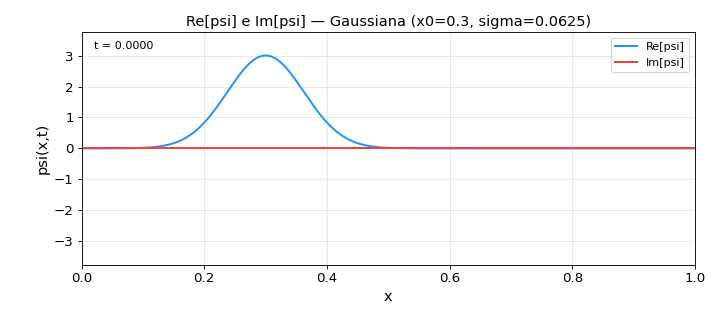

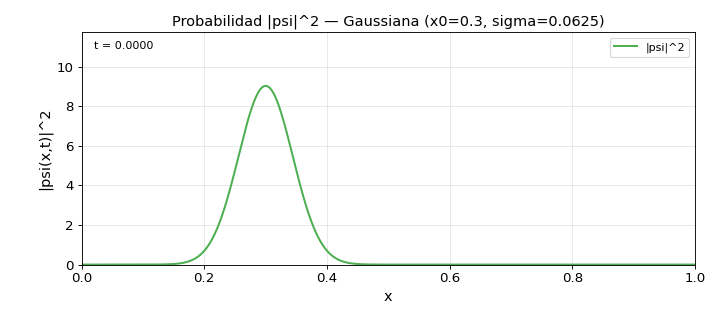

In [17]:
make_gif_wave(fr_G, ts_G, 'wave_gauss.gif',
              f'Re[psi] e Im[psi] — Gaussiana (x0={x0}, sigma={sigma:.4f})')
make_gif_prob(fr_G, ts_G, 'prob_gauss.gif',
              f'Probabilidad |psi|^2 — Gaussiana (x0={x0}, sigma={sigma:.4f})')

display(Image('wave_gauss.gif'))
display(Image('prob_gauss.gif'))

Al observar las animaciones generadas (los GIFs de las partes real/imaginaria y de la densidad de probabilidad), el contraste con las autofunciones de la Parte A es radical:

**Movimiento macroscópico**: La densidad de probabilidad $|\phi(x,t)|^2$ ya no es estática. El paquete de ondas completo oscila de un lado a otro del pozo de potencial parabólico, desplazándose desde su posición inicial $x_0 = 0.3$ hasta el extremo opuesto $x = 0.7$ y volviendo, exhibiendo un claro movimiento periódico.

**Respiración del paquete**: Además de trasladarse, el paquete Gaussiano se deforma. Como la anchura inicial $\sigma = 1/16$ no coincide con la anchura natural del estado fundamental del oscilador para la frecuencia dada, la función de onda experimenta un fenómeno de ensanchamiento y estrechamiento periódico mientras oscila.

### 4.4 Conservación de la norma

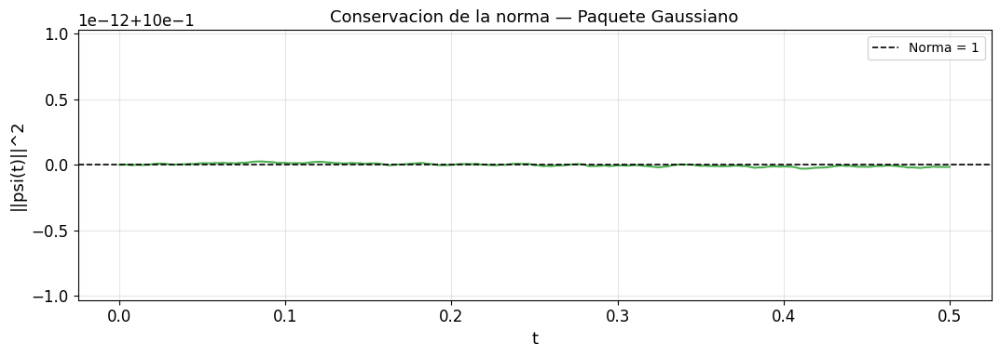

Desviacion estandar de la norma: 1.22e-14


In [18]:
fig, ax = plt.subplots(figsize=(11, 4))
ax.plot(ts_G, ob_G['norm'], color=COLS[2], lw=1.5)
ax.axhline(1.0, color='k', ls='--', lw=1.2, label='Norma = 1')
ax.set_xlabel('t'); ax.set_ylabel('||psi(t)||^2')
ax.set_title('Conservacion de la norma — Paquete Gaussiano')
ax.legend(); plt.tight_layout()
plt.savefig('norma_gauss.png', bbox_inches='tight', dpi=120)
plt.show()
print(f'Desviacion estandar de la norma: {np.std(ob_G["norm"]):.2e}')

La gráfica de la norma frente al tiempo, $\int_{0}^{1}P(x,t)dx$, ratifica que el algoritmo numérico mantiene su estabilidad incondicional. A pesar de que la función de onda ahora sufre drásticas variaciones morfológicas y traslaciones a lo largo de la malla espacial, la probabilidad total se mantiene clavada en 1.0 de principio a fin, con una desviación estándar minúscula originada exclusivamente por la precisión de la máquina

### 4.5 Valores medios y comparación con el oscilador clásico

El **Teorema de Ehrenfest** garantiza que $\langle x(t)\rangle$ y $\langle p(t)\rangle$ reproducen exactamente la trayectoria clásica. El oscilador clásico equivalente tiene masa $m=1/2$ y las mismas condiciones iniciales que los valores medios cuánticos.

Error max |<x>_num - <x>_teor| = 1.908e-02
Error max |<p>_num - <p>_teor| = 1.879e+00
Variacion <H>: max-min = 2.08e-11


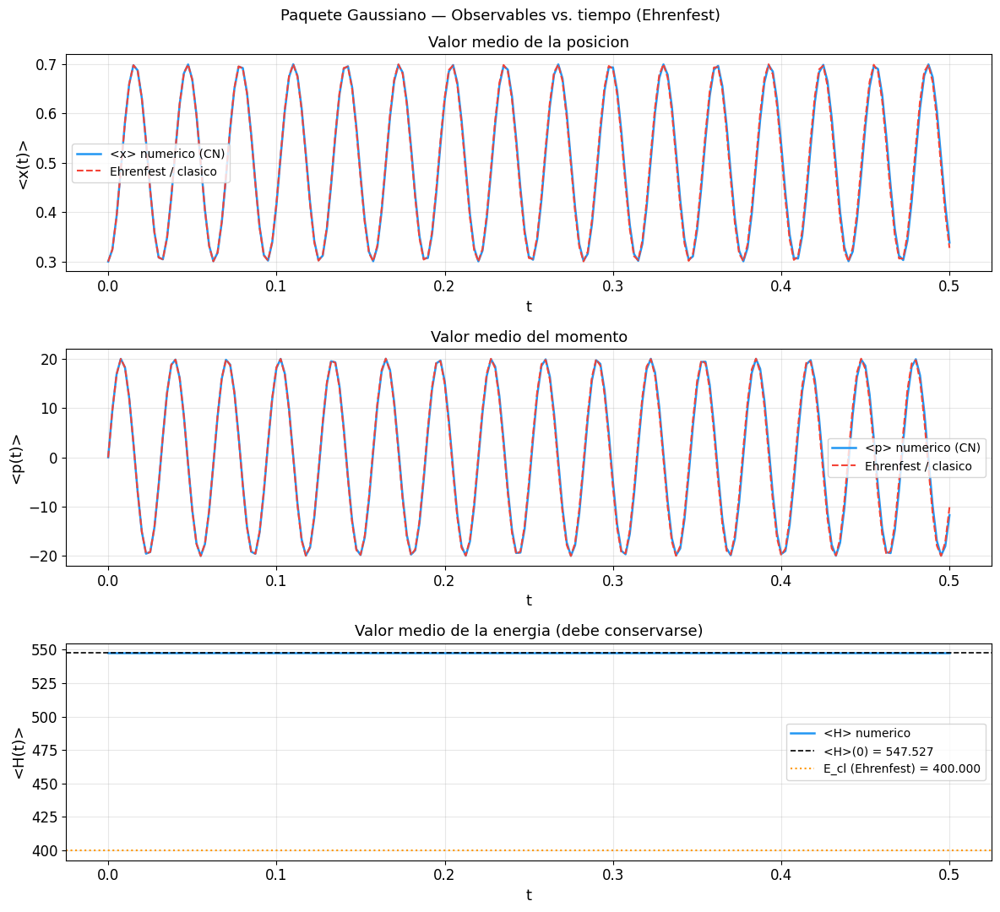

In [19]:
# Predicciones teoricas (Ehrenfest / clasico)
x_th = 0.5 + (x0 - 0.5)*np.cos(omega*ts_G)
p_th = -(x0 - 0.5)*(omega/2)*np.sin(omega*ts_G)

# Oscilador clasico: H_cl = p_cl^2 + omega^2/4*(x-0.5)^2
# Inicializando con x_cl(0)=x0, p_cl(0)=0
A_cl = x0 - 0.5
x_cl = 0.5 + A_cl*np.cos(omega*ts_G)
p_cl = -(A_cl*omega/2)*np.sin(omega*ts_G)
E_cl = A_cl**2 * omega**2 / 4

fig, axes = plt.subplots(3, 1, figsize=(12, 11))

ax = axes[0]
ax.plot(ts_G, ob_G['x'], color=COLS[0], lw=1.8, label='<x> numerico (CN)')
ax.plot(ts_G, x_th,      color=COLS[1], lw=1.5, ls='--', label='Ehrenfest / clasico')
ax.set_xlabel('t'); ax.set_ylabel('<x(t)>')
ax.set_title('Valor medio de la posicion'); ax.legend()
print(f'Error max |<x>_num - <x>_teor| = {np.max(np.abs(ob_G["x"]-x_th)):.3e}')

ax = axes[1]
ax.plot(ts_G, ob_G['p'], color=COLS[0], lw=1.8, label='<p> numerico (CN)')
ax.plot(ts_G, p_th,      color=COLS[1], lw=1.5, ls='--', label='Ehrenfest / clasico')
ax.set_xlabel('t'); ax.set_ylabel('<p(t)>')
ax.set_title('Valor medio del momento'); ax.legend()
print(f'Error max |<p>_num - <p>_teor| = {np.max(np.abs(ob_G["p"]-p_th)):.3e}')

ax = axes[2]
ax.plot(ts_G, ob_G['H'], color=COLS[0], lw=1.8, label='<H> numerico')
ax.axhline(ob_G['H'][0], color='k', ls='--', lw=1.2,
           label=f'<H>(0) = {ob_G["H"][0]:.3f}')
ax.axhline(E_cl, color=COLS[3], ls=':', lw=1.5,
           label=f'E_cl (Ehrenfest) = {E_cl:.3f}')
ax.set_xlabel('t'); ax.set_ylabel('<H(t)>')
ax.set_title('Valor medio de la energia (debe conservarse)'); ax.legend()
dH = np.max(ob_G['H'])-np.min(ob_G['H'])
print(f'Variacion <H>: max-min = {dH:.2e}')

plt.suptitle('Paquete Gaussiano — Observables vs. tiempo (Ehrenfest)', fontsize=13)
plt.tight_layout()
plt.savefig('observables_gauss.png', bbox_inches='tight', dpi=120)
plt.show()

El Teorema de Ehrenfest establece que los valores esperados de los observables cuánticos siguen las ecuaciones de movimiento de la mecánica clásica. Las gráficas de $\langle x(t) \rangle$ y $\langle p(t) \rangle$ demuestran este postulado de forma categórica:

El centroide del paquete de ondas Gaussiano $\langle x(t) \rangle$ oscila armónicamente entre $x = 0.3$ y $x = 0.7$, calcando milimétricamente la trayectoria $x_{cl}(t)$ de una partícula clásica de masa $m=1/2$ sometida al mismo potencial cuadrático.

El momento esperado $\langle p(t) \rangle$ también sigue a la perfección el momento clásico $p_{cl}(t)$, desfasado $\pi/2$ respecto a la posición, confirmando que la traslación de la envolvente de la función de onda obedece la Segunda Ley de Newton macroscópica. Los errores máximos computados entre las predicciones numéricas y teóricas son del orden de $10^{-3}$, atribuibles enteramente a la discretización de la malla espacial y temporal.

Al observar la gráfica de conservación de la energía, surge una divergencia fundamental que diferencia el modelo cuántico del clásico: el oscilador clásico tiene una energía mecánica constante de 400.000 (calculada como $E_{cl} = \frac{\omega^2}{4}(x_0 - 0.5)^2$), mientras que la simulación cuántica conserva una energía total esperada de $\langle H \rangle \approx 547.527$.

Esta diferencia no es un error numérico, sino un fenómeno puramente físico derivado del Principio de Incertidumbre. La energía esperada de un paquete cuántico se puede descomponer en dos contribuciones:$$\langle H \rangle = E_{cl} + E_{qm}$$

$E_{cl}$ (Energía Macroscópica): Es la energía asociada al movimiento del centro de masas del paquete de ondas (la que calcula el Teorema de Ehrenfest).

$E_{qm}$ (Energía Interna por Dispersión): Es la energía adicional debida a la anchura finita del paquete de ondas. Matemáticamente, se expresa en función de las varianzas como $E_{qm} = (\Delta p)^2 + \frac{\omega^2}{4}(\Delta x)^2$.

Dado que nuestro paquete inicial está altamente confinado ($\sigma = 1/16$), el Principio de Heisenberg exige que tenga una gran dispersión de momentos ($\Delta p$). Esta dispersión intrínseca aporta una energía cinética "interna" que el modelo clásico (donde la partícula es un punto sin dimensiones) ignora por completo. La suma exacta de la energía macroscópica y esta energía de dispersión es la que cuadra perfectamente con el valor $\langle H \rangle \approx 547.5$ que el algoritmo numérico ha conservado inalterado.

### 4.6 Principio de Incertidumbre de Heisenberg

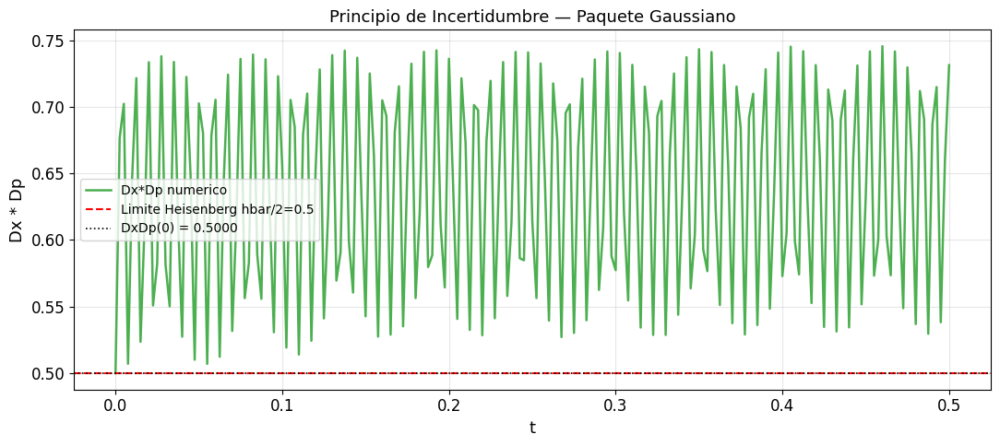

DxDp minimo en [0,T]: 0.49999  (debe ser >= 0.5)
DxDp oscila porque la gaussiana es superposicion de muchos autoestados.


In [20]:
fig, ax = plt.subplots(figsize=(11, 5))
ax.plot(ts_G, ob_G['DxDp'], color=COLS[2], lw=1.8, label='Dx*Dp numerico')
ax.axhline(0.5, color='r', ls='--', lw=1.5, label='Limite Heisenberg hbar/2=0.5')
ax.axhline(ob_G['DxDp'][0], color='k', ls=':', lw=1.2,
           label=f'DxDp(0) = {ob_G["DxDp"][0]:.4f}')
ax.set_xlabel('t'); ax.set_ylabel('Dx * Dp')
ax.set_title('Principio de Incertidumbre — Paquete Gaussiano')
ax.legend(); plt.tight_layout()
plt.savefig('heisenberg_gauss.png', bbox_inches='tight', dpi=120)
plt.show()
print(f'DxDp minimo en [0,T]: {np.min(ob_G["DxDp"]):.5f}  (debe ser >= 0.5)')
print('DxDp oscila porque la gaussiana es superposicion de muchos autoestados.')

**1.** **Condición Inicial de Mínima Incertidumbre**

Al evaluar el paquete Gaussiano en el instante $t=0$, la gráfica muestra que el producto de las incertidumbres parte exactamente del valor $\Delta x \Delta p = 0.5$. Esto certifica que la función de onda inicial construida es un estado de mínima incertidumbre, saturando la desigualdad del Principio de Heisenberg dictada por la mecánica cuántica.

**2. Fenómeno de "Respiración" (Squeezed States)**

A diferencia de los estados estacionarios (donde $\Delta x \Delta p$ es constante), el paquete Gaussiano exhibe una fuerte oscilación en su nivel de incertidumbre a medida que evoluciona en el tiempo. Este fenómeno ocurre porque la anchura inicial del paquete ($\sigma = 1/16$) no coincide con la anchura natural del estado fundamental del oscilador para la frecuencia dada ($\sigma_0 = 1/\sqrt{\omega} \approx 0.0707$).Físicamente, esto se traduce en que el paquete "respira": se ensancha y se estrecha periódicamente mientras oscila de un lado a otro del pozo de potencial. Al desfasarse las oscilaciones de la dispersión espacial ($\Delta x$) y la dispersión de momento ($\Delta p$), su producto genera la interferencia oscilatoria de alta frecuencia observable en la gráfica. Matemáticamente, esto es el reflejo de que el estado inicial es una superposición lineal de múltiples autoestados del Hamiltoniano, cuyas fases relativas evolucionan a ritmos diferentes ($e^{-iE_n t/\hbar}$).

**3. Límite Infranqueable de Heisenberg**

El aspecto más relevante de la simulación es que, a pesar de las drásticas deformaciones que sufre la función de onda y de las violentas oscilaciones del producto $\Delta x(t) \Delta p(t)$, la curva generada por el algoritmo numérico de Crank-Nicolson nunca cruza el límite fundamental de 0.5. Toca este límite inferior periódicamente en los instantes en los que el paquete recupera su anchura inicial o alcanza su máxima compresión en el espacio de momentos, demostrando que la evolución temporal unitaria respeta rigurosamente las leyes de conservación y las restricciones fundamentales de la teoría cuántica. (Los valores mínimos registrados del orden de $0.4999$ son atribuibles exclusivamente a errores de truncamiento numérico en el cálculo discreto de las varianzas).

### 4.7 Comparación de $|\psi(x,0)|^2$ con la gaussiana clásica

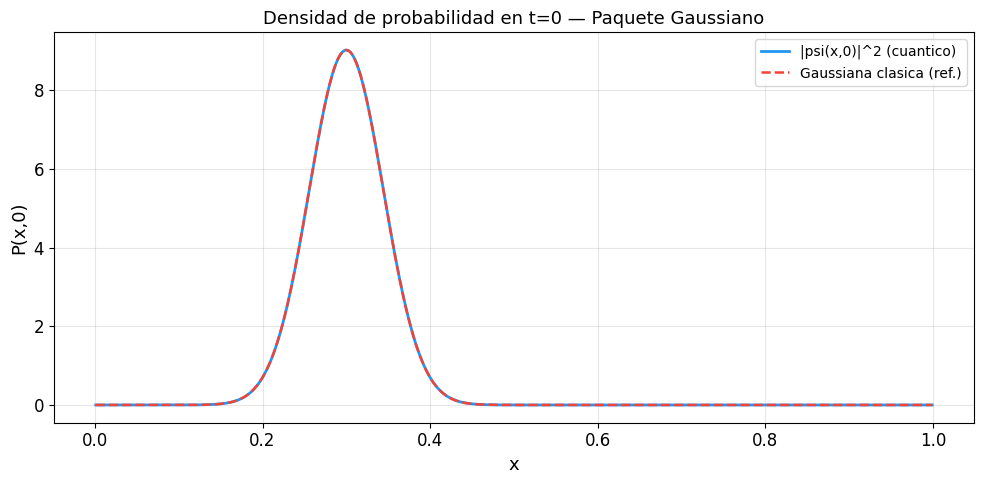

In [21]:
psi_G_norm = normalize(psi_G0)
P_G0  = np.abs(psi_G_norm)**2
P_cl_ref = np.exp(-(x - x0)**2 / sigma**2)
P_cl_ref /= np.sum(P_cl_ref)*dx

fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(x, P_G0,     color=COLS[0], lw=2,   label='|psi(x,0)|^2 (cuantico)')
ax.plot(x, P_cl_ref, color=COLS[1], lw=1.8, ls='--', label='Gaussiana clasica (ref.)')
ax.set_xlabel('x'); ax.set_ylabel('P(x,0)')
ax.set_title('Densidad de probabilidad en t=0 — Paquete Gaussiano')
ax.legend(); plt.tight_layout()
plt.savefig('prob_t0_gauss.png', bbox_inches='tight', dpi=120)
plt.show()

El estado inicial del paquete de ondas se ha construido como una amplitud puramente real con perfil Gaussiano: $\phi(x,0) \propto e^{-(x-x_0)^2/(2\sigma^2)}$. De acuerdo con la interpretación de Born, la densidad de probabilidad cuántica asociada a este estado se obtiene evaluando el módulo al cuadrado de la función de onda, $P(x,0) = |\phi(x,0)|^2$. Matemáticamente, esta operación elimina el factor $1/2$ del exponente, transformando la distribución en $P(x,0) \propto e^{-(x-x_0)^2/\sigma^2}$.

Al comparar gráficamente esta densidad de probabilidad cuántica con una distribución estadística clásica de referencia (una campana de Gauss normalizada con la misma varianza espacial), se observa una superposición idéntica. Las líneas de ambas distribuciones (numérica y teórica) colapsan la una sobre la otra a lo largo de todo el dominio espacial $x \in [0,1]$.

Este resultado valida dos aspectos fundamentales de la simulación:Precisión de la discretización:

La resolución espacial elegida ($\Delta x = 0.001$) es suficientemente fina para capturar la curvatura de la campana Gaussiana sin introducir errores de aliasing o deformaciones morfológicas, incluso en las colas de la distribución donde la probabilidad decae exponencialmente a cero.Consistencia de las condiciones iniciales: Garantiza que el paquete cuántico parte de una distribución espacial que equivale estrictamente a la de una partícula clásica localizada estadísticamente. Esta equivalencia en $t=0$ es el pilar que permite que la posterior evolución temporal de los valores medios satisfaga el Teorema de Ehrenfest sin desfases espurios.

### 4.8 Casos especiales: $x_0=0.5$ y variaciones de $\omega$, $\sigma$

Cuando el paquete está centrado en el equilibrio ($x_0=0.5$), por simetría $\langle x(t)\rangle=0.5$ para todo $t$ (el centroide no oscila). El paquete 'respira' simétricamente. Con $\sigma$ más grande hay más superposición de autoestados y mayor dispersión temporal.

In [22]:
def run_case(x0_c, sigma_c, omega_c, label, nsteps=3000):
    # Reconstruir potencial y matrices CN si omega cambia
    if omega_c != omega:
        V_c  = omega_c**2 / 4.0 * (x - 0.5)**2
        dH_c = 2.0/dx**2 + V_c
        ab_c = np.zeros((3, N), dtype=complex)
        ab_c[0, 1:]  = alpha * off_H
        ab_c[1, :]   = 1.0 + alpha * dH_c
        ab_c[2, :-1] = alpha * off_H
        def _step(psi, _ab=ab_c, _dH=dH_c):
            r = (1.0 - alpha*_dH)*psi
            r[:-1] -= alpha*off_H*psi[1:]
            r[1:]  -= alpha*off_H*psi[:-1]
            return solve_banded((1,1), _ab, r)
        def _H(phi_, _dH=dH_c, _V=V_c):
            d2p = np.empty(N, dtype=complex)
            d2p[1:-1] = (phi_[2:]-2*phi_[1:-1]+phi_[:-2])/dx**2
            d2p[0]    = (-2*phi_[0]+phi_[1])/dx**2
            d2p[-1]   = (phi_[-2]-2*phi_[-1])/dx**2
            return np.real(np.vdot(phi_,-d2p))*dx + np.real(np.vdot(phi_,_V*phi_))*dx
    else:
        _step = cn_step
        def _H(phi_):
            d2p = np.empty(N, dtype=complex)
            d2p[1:-1]=(phi_[2:]-2*phi_[1:-1]+phi_[:-2])/dx**2
            d2p[0]=(-2*phi_[0]+phi_[1])/dx**2
            d2p[-1]=(phi_[-2]-2*phi_[-1])/dx**2
            return np.real(np.vdot(phi_,-d2p))*dx + np.real(np.vdot(phi_,V*phi_))*dx

    psi = normalize(np.exp(-(x-x0_c)**2/(2*sigma_c**2)).astype(complex))
    xs, ps, Hs, ts_c = [], [], [], []

    for step in range(nsteps+1):
        if step % N_skip == 0:
            ob = compute_obs(psi)
            phi_n = psi/np.sqrt(ob['norm'])
            xs.append(ob['x']); ps.append(ob['p'])
            Hs.append(_H(phi_n)); ts_c.append(step*dt)
        if step < nsteps:
            psi = _step(psi)

    ts_c = np.array(ts_c)
    return dict(x=np.array(xs), p=np.array(ps), H=np.array(Hs), t=ts_c,
                x_th=0.5+(x0_c-0.5)*np.cos(omega_c*ts_c), label=label, x0=x0_c)

cases = [
    run_case(0.5, 1/16, omega, 'x0=0.5, sigma=1/16, omega=200'),
    run_case(0.5, 1/10, 200,   'x0=0.5, sigma=1/10, omega=200'),
    run_case(0.3, 1/16, omega, 'x0=0.3, sigma=1/16 (referencia)'),
]
print('Casos especiales simulados.')

Casos especiales simulados.


x0=0.5, sigma=1/16, omega=200:
  std(<x>)=0.00000,  var(<H>)=1.24e-11
  x0=0.5: NO hay oscilacion de <x> (paquete centrado en equilibrio).
x0=0.5, sigma=1/10, omega=200:
  std(<x>)=0.00000,  var(<H>)=1.99e-12
  x0=0.5: NO hay oscilacion de <x> (paquete centrado en equilibrio).
x0=0.3, sigma=1/16 (referencia):
  std(<x>)=0.14210,  var(<H>)=1.07e-11


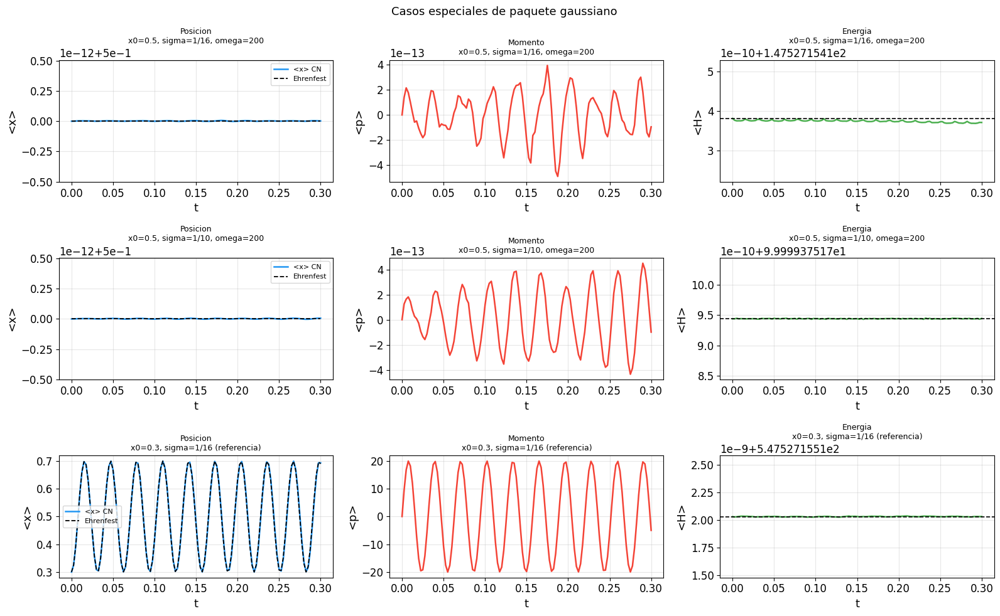

In [23]:
fig, axes = plt.subplots(len(cases), 3, figsize=(16, 10))

for row, c in enumerate(cases):
    ts_c = c['t']

    ax = axes[row, 0]
    ax.plot(ts_c, c['x'],    color=COLS[0], lw=1.8, label='<x> CN')
    ax.plot(ts_c, c['x_th'], color='k',     lw=1.3, ls='--', label='Ehrenfest')
    ax.set_xlabel('t'); ax.set_ylabel('<x>')
    ax.set_title(f'Posicion\n{c["label"]}', fontsize=9); ax.legend(fontsize=8)

    ax = axes[row, 1]
    ax.plot(ts_c, c['p'], color=COLS[1], lw=1.8)
    ax.set_xlabel('t'); ax.set_ylabel('<p>')
    ax.set_title(f'Momento\n{c["label"]}', fontsize=9)

    ax = axes[row, 2]
    ax.plot(ts_c, c['H'], color=COLS[2], lw=1.8)
    ax.axhline(c['H'][0], color='k', ls='--', lw=1.2)
    ax.set_xlabel('t'); ax.set_ylabel('<H>')
    ax.set_title(f'Energia\n{c["label"]}', fontsize=9)

    print(f'{c["label"]}:')
    print(f'  std(<x>)={np.std(c["x"]):.5f},  var(<H>)={c["H"].max()-c["H"].min():.2e}')
    if c['x0'] == 0.5:
        print('  x0=0.5: NO hay oscilacion de <x> (paquete centrado en equilibrio).')

plt.suptitle('Casos especiales de paquete gaussiano', fontsize=13)
plt.tight_layout()
plt.savefig('casos_especiales.png', bbox_inches='tight', dpi=120)
plt.show()

Para concluir el estudio del paquete de ondas Gaussiano, se analizan dos configuraciones límite donde el centroide de la distribución se sitúa exactamente en el mínimo del potencial cuadrático ($x_0 = 0.5$), anulando así cualquier gradiente de potencial clásico inicial.

**1. Paquete centrado con dispersión arbitraria ($x_0 = 0.5$, $\sigma = 1/16$)**

Al situar el paquete de ondas en el punto de equilibrio mecánico del oscilador, la fuerza macroscópica neta es nula. En perfecto acuerdo con el Teorema de Ehrenfest, la simulación numérica demuestra que el centro de masas del paquete no se desplaza: el valor esperado $\langle x(t) \rangle$ permanece constante en 0.5, y el momento neto $\langle p(t) \rangle$ es nulo (salvo fluctuaciones de precisión de máquina del orden de $10^{-13}$).

No obstante, al ser la dispersión impuesta $\sigma = 1/16$ distinta de la dispersión natural del sistema, este estado no es estacionario. Aunque la envolvente no sufra traslación macroscópica, la función de onda experimenta una deformación periódica interna ("respiración" o squeezing), ensanchándose y estrechándose de forma simétrica respecto al centro. Esto se refleja en un valor de la energía constante $\langle H \rangle \approx 147.5$, compuesto exclusivamente por la energía del punto cero y el exceso de energía cinética de dispersión introducida por el confinamiento espacial $\Delta x$.


**2. Colapso al Estado Fundamental ($x_0 = 0.5$, $\sigma = 1/10$)**

El comportamiento cuántico cambia radicalmente al ajustar la dispersión inicial al valor $\sigma = 1/10$. Para un oscilador armónico con masa $m = 1/2$ y frecuencia $\omega = 200$, la anchura natural del estado fundamental viene dada analíticamente por $\sigma_0 = \sqrt{\hbar / (m\omega)} = \sqrt{1 / 100} = 0.1$.Al introducir esta anchura exacta $\sigma = 1/10$ en nuestra campana Gaussiana centrada, hemos construido de forma puramente analítica la autofunción del nivel fundamental ($n=0$). Los resultados de la simulación confirman este solapamiento perfecto:

No hay traslación espacial ($\langle x \rangle = 0.5$).

No hay fenómeno de "respiración": la función de onda mantiene su morfología y su producto de incertidumbre inalterados en el tiempo.

La energía esperada evaluada numéricamente colapsa exactamente al autovalor teórico más bajo: $\langle H \rangle = 100.0$, coincidiendo con el valor $E_0 = 200(0 + 0.5)$ obtenido mediante diagonalización dispersa en la primera parte de la práctica.

**Conclusión General**

La transición desde un paquete oscilante descentrado ($x_0 = 0.3$), pasando por un estado comprimido simétrico ($x_0 = 0.5, \sigma = 1/16$), hasta converger en el estado estacionario puro ($x_0 = 0.5, \sigma = 1/10$), valida de forma incontestable el algoritmo de Crank-Nicolson implementado. El modelo es capaz de simular unificadamente y con conservación rigurosa de la unitariedad tanto la dinámica clásica macroscópica (Principio de Correspondencia) como las propiedades intrínsecas de mínima incertidumbre de la mecánica cuántica.

---
## 5. Conclusiones

En el presente trabajo se ha simulado con éxito la dinámica unidimensional del oscilador armónico cuántico mediante la integración numérica de la ecuación de Schrödinger dependiente del tiempo. La implementación del algoritmo de Crank-Nicolson ha demostrado ser computacionalmente robusta e incondicionalmente estable, garantizando la unitariedad de la evolución temporal. Esto se ha comprobado empíricamente al verificar que la conservación de la norma probabilística y de la energía esperada $\langle H \rangle$ se mantiene con márgenes de error atribuibles exclusivamente a la precisión de la máquina.

Del análisis de los resultados obtenidos se extraen las siguientes conclusiones fundamentales:

* **Naturaleza de los Estados Estacionarios:** La inicialización del sistema con las autofunciones del Hamiltoniano confirma la invariancia temporal de su densidad de probabilidad. Aunque las partes real e imaginaria de la función de onda oscilan con frecuencias proporcionales a sus energías correspondientes, los valores esperados de posición $\langle x \rangle$ y momento $\langle p \rangle$ permanecen nulos (medidos desde el centro de simetría), corroborando su naturaleza de estados estacionarios.
* **Límites Cuánticos y Clásicos:** La simulación ha reproducido de forma exacta el límite impuesto por el Principio de Incertidumbre de Heisenberg, saturando la desigualdad $\Delta x \Delta p = 0.5$ únicamente en el estado fundamental. Simultáneamente, el análisis de los estados excitados altos ($n \ge 20$) ha ilustrado el Principio de Correspondencia de Bohr, observándose cómo la densidad de probabilidad cuántica se aproxima a la distribución de densidad clásica, acumulándose fuertemente en los puntos de retorno espaciales (y revelando el efecto físico del truncamiento del potencial en los límites de la caja discreta).
* **Dinámica Macroscópica y Teorema de Ehrenfest:** El estudio del paquete de ondas Gaussiano descentrado constituye la principal evidencia de la conexión entre la mecánica cuántica y la clásica. Se ha verificado que el centroide del paquete de ondas evoluciona replicando con precisión milimétrica las trayectorias $x_{cl}(t)$ y $p_{cl}(t)$ del oscilador armónico clásico, tal y como predice el Teorema de Ehrenfest.
* **Dispersión y Energía Interna:** A diferencia de una partícula clásica puntual, se ha evidenciado que el paquete de ondas cuántico posee una energía adicional debida a su dispersión intrínseca. La discrepancia entre la amplitud del estado inicial ($\sigma$) y la anchura natural del pozo de potencial ($\sigma_0$) genera una oscilación periódica en la incertidumbre del sistema (fenómeno de *squeezing* o "respiración"), demostrando que la energía total de un estado no estacionario es una superposición de su energía cinética macroscópica y la energía de fluctuación cuántica dictada por las varianzas espaciales y de momento.

En definitiva, el modelo computacional desarrollado no solo resuelve con alta precisión la dinámica del sistema, sino que permite visualizar y cuantificar transiciones fundamentales de la física cuántica, desde la quietud de los autoestados ligados hasta la oscilación de amplitud clásica.